## **Содержание**

В ходе занятия в порядке исторического развития будут расмотрены алгоритмы градиентного спуска, лежащие в основе torch.optim, а также привидены наглядные 2D/3D визуализации для исследования особенностей их работы.

## **Импорт библиотек**

In [1]:
import math
import numpy as np
import plotly.io as pio
pio.renderers.default = 'notebook_connected'
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots

## **Тестовые поверхности**

In [2]:
class SaddleTest:
  x_space = np.linspace(-5, 5, 100)
  y_space = np.linspace(-5, 5, 100)

  start_x = 5
  start_y = 0

  colorscale = 'Viridis'

  @classmethod
  def surface_function(cls, x, y):
    return x**2 - y**2

  @classmethod
  def grad_x(cls, x, y):
    return 2*x

  @classmethod
  def grad_y(cls, x, y):
    return -2*y

In [3]:
class Bukin6Test:
  """
  f(-10, 1) = 0
  """
  x_space = np.linspace(-15, -5, 100)
  y_space = np.linspace(-4, 6, 100)

  start_x = -14
  start_y = 5

  colorscale = 'Viridis'

  @classmethod
  def surface_function(cls, x, y):
    return 100 * np.sqrt(np.abs(y - 0.01 * x**2)) \
      + 0.01 * np.abs(x + 10)

  @classmethod
  def grad_x(cls, x, y):
    df_dx = 0
    if x + 10 > 0:
      df_dx += 0.01
    else:
      df_dx -= 0.01

    if y - 0.01*x**2 > 0:
      df_dx += (0 - 0.02 * x) / (2 * np.sqrt(np.abs(y - 0.01 * x**2)))
    else:
      df_dx += (0 - 0.02 * x) / (2 * np.sqrt(np.abs(y - 0.01 * x**2)))
    return df_dx

  @classmethod
  def grad_y(cls, x, y):
    df_dy = 0
    if y - 0.01*x**2 > 0:
      df_dy = 100 / (2 * np.sqrt(np.abs(y - 0.01 * x**2)))
    else:
      df_dy = -100 / (2 * np.sqrt(np.abs(y - 0.01 * x**2)))
    return df_dy

In [4]:
class RosenbrockTest:
  """
  f(1, 1) = 0
  """
  x_space = np.linspace(-2, 2, 250)
  y_space = np.linspace(-1, 3, 250)
  minimum = (1.0, 1.0)

  start_x = -2
  start_y = 1

  @classmethod
  def surface_function(cls, x, y):
    return (1 - x) ** 2 + 100 * (y - x**2) ** 2

  @classmethod
  def grad_x(cls, x, y):
    return -2 * (1 - x) - 400 * x * (y - x**2)

  @classmethod
  def grad_y(cls, x, y):
    return 200 * (y - x**2)

In [5]:
class RastriginTest:
  x_space = np.linspace(-5, 5, 100)
  y_space = np.linspace(-5, 5, 100)

  start_x = -2.0
  start_y = 3.5

  colorscale = 'Viridis'

  @classmethod
  def surface_function(cls, x, y):
    A = 10
    return A*2 + (x**2 - A * np.cos(2 * np.pi * x)) + \
      (y**2 - A * np.cos(2 * np.pi * y))

  @classmethod
  def grad_x(cls, x, y):
    A = 10
    return 2*x + 2*np.pi*A*np.sin(2*np.pi*x)

  @classmethod
  def grad_y(cls, x, y):
    A = 10
    return 2*y + 2*np.pi*A*np.sin(2*np.pi*y)

Функции для визуализаций траекторий:

In [6]:
def visualize_descent_plotly(test_cls, path):
    """
    paths - list of tuples (float x, float y)
    """
    
    x_grid, y_grid = np.meshgrid(test_cls.x_space, test_cls.y_space)
    z_grid = test_cls.surface_function(x_grid, y_grid)
    x_values, y_values = path[:, 0], path[:, 1]
    z_values = test_cls.surface_function(x_values, y_values)
    
    # Создание фигуры с сеткой подграфиков: 1 ряд, 2 колонки
    fig = make_subplots(rows=1, cols=2,
          specs=[[{'type': 'surface'}, {'type': 'xy'}]],
          subplot_titles=('3D Visualization', '2D Contour Projection'))
    
    # Добавление 3D поверхности на подграфик (1, 1)
    fig.add_trace(go.Surface(
        x=x_grid, y=y_grid, z=z_grid, colorscale=test_cls.colorscale),
                  row=1, col=1)
    
    # Добавление 3D линии градиентного спуска
    fig.add_trace(go.Scatter3d(
        x=x_values, y=y_values, z=z_values, mode='markers+lines',
        marker=dict(size=5), line=dict(width=1)), row=1, col=1)
    
    # Добавление 2D контурного графика на подграфик (1, 2)
    fig.add_trace(go.Contour(
        x=test_cls.x_space, y=test_cls.y_space, z=z_grid,
        colorscale=test_cls.colorscale, line_width=2), row=1, col=2)

    # Добавление 2D линии градиентного спуска
    fig.add_trace(go.Scatter(
        x=x_values, y=y_values, mode='markers+lines', marker=dict(size=5),
        line=dict(width=1), line_color="red"), row=1, col=2)
    
    # Обновление макета для подграфиков
    fig.update_layout(title='Optimization Visualization',
                    autosize=True,
                    showlegend=False)

    fig.show()

In [7]:
def visualize_descent_matplotlib(test_cls, path):
  """
  paths - list of tuples (float x, float y)
  """

  X, Y = np.meshgrid(test_cls.x_space, test_cls.y_space)
  Z = test_cls.surface_function(X, Y)

  iter_x, iter_y = path[:, 0], path[:, 1]

  fig = plt.figure(figsize=(8, 8))

  ax = fig.add_subplot(1, 1, 1)
  ax.contour(X, Y, Z, 90, cmap="jet")
  ax.plot(iter_x, iter_y, color="r", marker="x")

  ax.set_title(
      "Rosenbrock func"
  )
  plt.plot(*test_cls.minimum, "gD")
  plt.plot(iter_x[-1], iter_y[-1], "rD")

Главная функция градиентного спуска и вызов optimizer:

In [8]:
def gradient_descent(test_cls, optimizer, num_iterations):
    x, y = test_cls.start_x, test_cls.start_y
    path = [(x, y)]
    for i in range(num_iterations):
        dx = test_cls.grad_x(x, y)
        dy = test_cls.grad_y(x, y)
        x, y = optimizer.step(x, dx, y, dy)

        if (not (test_cls.x_space[0] <= x <= test_cls.x_space[-1]) or
           not (test_cls.y_space[0] <= y <= test_cls.y_space[-1])):
          print(f"Achieve {test_cls.__name__} bounds - stop descent on iteration {i}")
          break
        path.append((x, y))
    return np.array(path)

## **Vanilla SGD**

* Описание: Простейшая форма SGD обновляет параметры модели, используя градиент потерь.
* Ограничения: Медленная сходимость, особенно при наличии седловых точек или когда градиент очень мал (проблема исчезающего градиента).

In [9]:
class SGD:
  def __init__(self, learning_rate):
    self.learning_rate = learning_rate

  def step(self, x, dx, y, dy):
    x, y = x - self.learning_rate * dx, y - self.learning_rate * dy
    return x, y

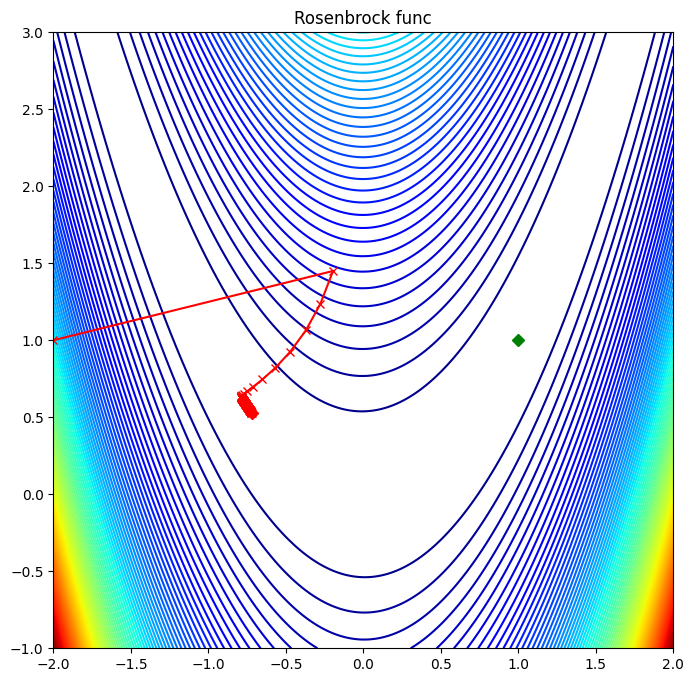

In [10]:
optimizer = SGD(learning_rate=0.00075)
path = gradient_descent(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_matplotlib(RosenbrockTest, path)

In [11]:
optimizer = SGD(learning_rate=0.1)
path = gradient_descent(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=50)
visualize_descent_plotly(SaddleTest, path)

In [12]:
optimizer = SGD(learning_rate=0.001)
path = gradient_descent(
          test_cls=Bukin6Test,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(Bukin6Test, path)

In [13]:
optimizer = SGD(learning_rate=0.001)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(RastriginTest, path)

## **Momentum SGD**

* Описание: Добавляет импульс, который помогает ускорить SGD в направлении градиента и подавляет колебания. Это достигается путем добавления части предыдущего вектора обновления к текущему обновлению (для случая изменения направления градиента).
* Преимущества: Более быстрая сходимость и уменьшение колебаний.

In [14]:
class MomentumSGD:
  def __init__(self, learning_rate, momentum_rate):
    self.learning_rate = learning_rate
    self.momentum_rate = momentum_rate

    self.momentum_ema_x = 0
    self.momentum_ema_y = 0

  def step(self, x, dx, y, dy):
    self.momentum_ema_x = (self.momentum_ema_x * self.momentum_rate +
        (1 - self.momentum_rate) * dx)
    self.momentum_ema_y = (self.momentum_ema_y * self.momentum_rate +
        (1 - self.momentum_rate) * dy)

    x = x - self.learning_rate * self.momentum_ema_x
    y = y - self.learning_rate * self.momentum_ema_y
    return x, y

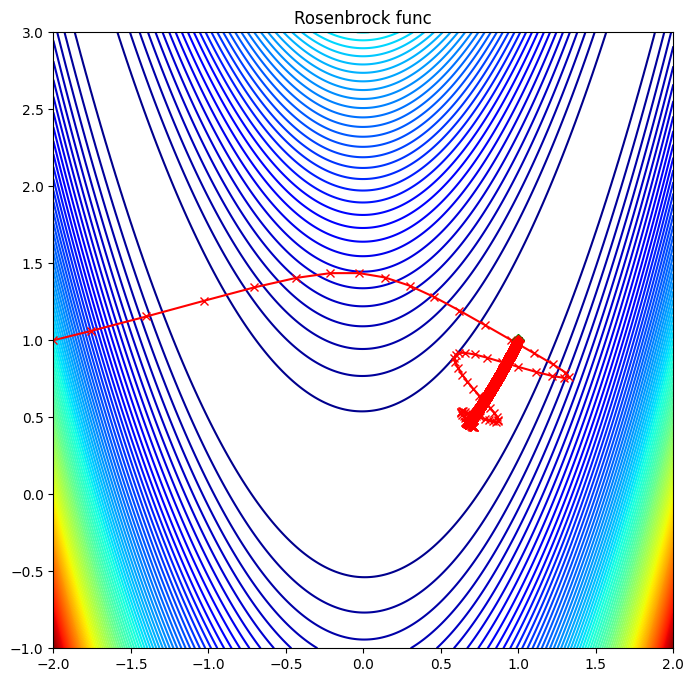

In [15]:
optimizer = MomentumSGD(learning_rate=0.001, momentum_rate=0.9)
path = gradient_descent(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_matplotlib(RosenbrockTest, path)

In [16]:
optimizer = MomentumSGD(learning_rate=0.1, momentum_rate=0.9)
path = gradient_descent(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=50)
visualize_descent_plotly(SaddleTest, path)

In [17]:
optimizer = MomentumSGD(learning_rate=0.001, momentum_rate=0.9)
path = gradient_descent(
          test_cls=Bukin6Test,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(Bukin6Test, path)

In [18]:
optimizer = MomentumSGD(learning_rate=0.001, momentum_rate=0.9)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(RastriginTest, path)

## **Nesterov Accelerated Gradient (NAG)**

* Описание: Разновидность Momentum SGD, которая вычисляет градиент потерь в точке, немного впереди в направлении импульса, а не в текущем положении.
* Преимущества: Может привести к более быстрой сходимости по сравнению с традиционным импульсом, поскольку градиент всегда указывает в правильном направлении, а импульс может и не указывать.

In [19]:
def gradient_descent_with_nesterov_momentum(test_cls, optimizer, num_iterations):
    x, y = test_cls.start_x, test_cls.start_y
    path = [(x, y)]
    for i in range(num_iterations):
        x, y = optimizer.step(x, test_cls.grad_x, y, test_cls.grad_y)

        if (not (test_cls.x_space[0] <= x <= test_cls.x_space[-1]) or
           not (test_cls.y_space[0] <= y <= test_cls.y_space[-1])):
          print(f"Achieve {test_cls.__name__} bounds - stop descent on iteration {i}")
          break
        path.append((x, y))
    return np.array(path)

In [20]:
class NesterovSGD:
  def __init__(self, learning_rate, momentum_rate):
    self.learning_rate = learning_rate
    self.momentum_rate = momentum_rate

    self.momentum_x = 0
    self.momentum_y = 0

  def step(self, x, dx_func, y, dy_func):
    ### look ahead from momentum term
    x_ahead = x + self.momentum_rate * self.momentum_x
    y_ahead = y + self.momentum_rate * self.momentum_y

    self.momentum_x = (self.momentum_x * self.momentum_rate -
        self.learning_rate * dx_func(x_ahead, y_ahead))
    self.momentum_y = (self.momentum_y * self.momentum_rate -
        self.learning_rate * dy_func(x_ahead, y_ahead))

    x = x + self.momentum_x
    y = y + self.momentum_y
    return x, y

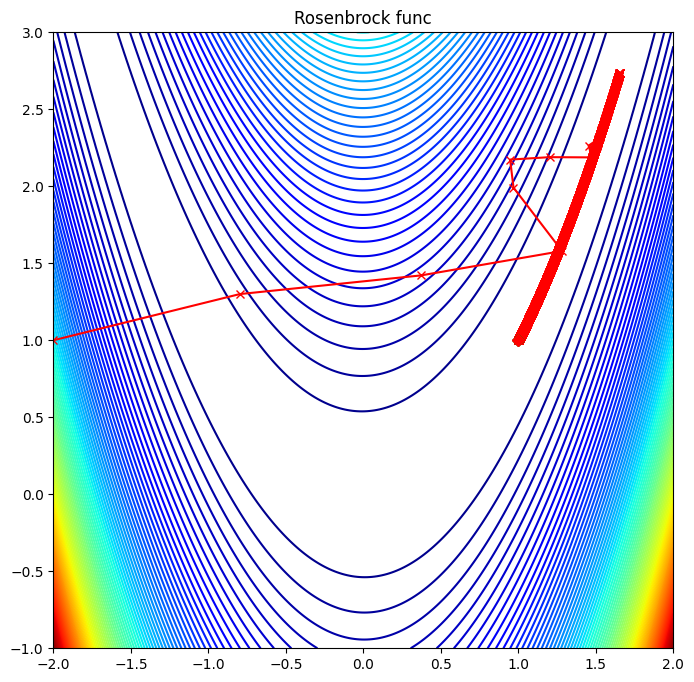

In [21]:
optimizer = NesterovSGD(learning_rate=0.0005, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_matplotlib(RosenbrockTest, path)

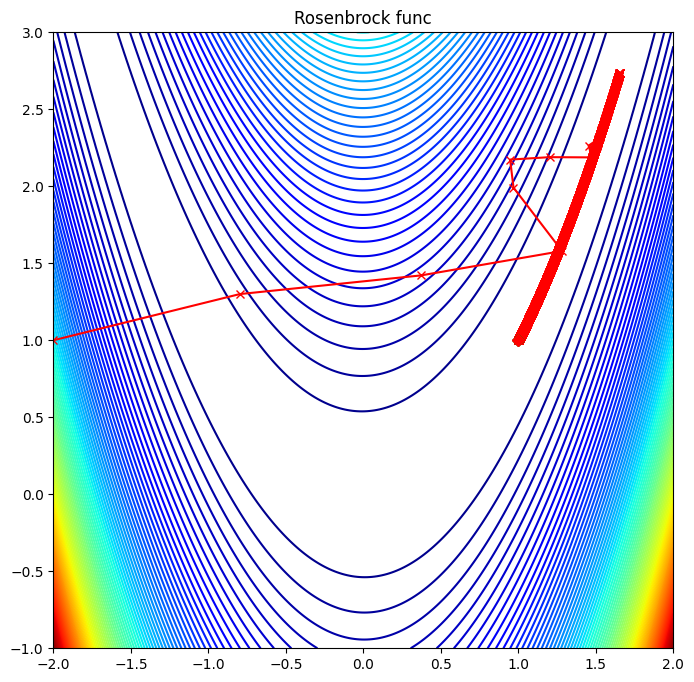

In [22]:
optimizer = NesterovSGD(learning_rate=0.0005, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_matplotlib(RosenbrockTest, path)

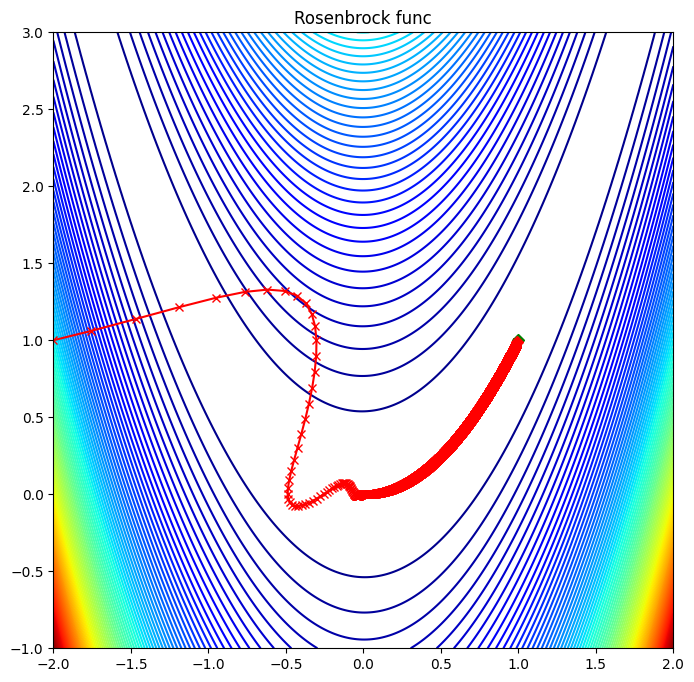

In [23]:
optimizer = NesterovSGD(learning_rate=0.0001, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_matplotlib(RosenbrockTest, path)

In [24]:
optimizer = NesterovSGD(learning_rate=0.1, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(SaddleTest, path)

In [25]:
optimizer = NesterovSGD(learning_rate=0.001, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=Bukin6Test,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(Bukin6Test, path)

Achieve Bukin6Test bounds - stop descent on iteration 251


In [26]:
optimizer = NesterovSGD(learning_rate=0.001, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(RastriginTest, path)

### **Adagrad**

* Описание: Адаптирует скорость обучения для каждого параметра, допуская более крупные и более мелкие обновления. Накапливает квадрат прошлых градиентов.
* Преимущества: Полезно для разреженных данных. Устраняет необходимость вручную настраивать скорость обучения.
* Ограничения: Непрерывно накапливающийся квадрат градиента может привести к сокращению скорости обучения и стать бесконечно малым, фактически останавливая дальнейшее обучение модели.

In [27]:
class Adagrad:
  def __init__(self, learning_rate):
    self.learning_rate = learning_rate
    self.cache_x = 0
    self.cache_y = 0
    self.eps = 1e-8

  def step(self, x, dx, y, dy):
    self.cache_x += dx ** 2
    self.cache_y += dy ** 2

    x = x - (self.learning_rate / (math.sqrt(self.cache_x) + self.eps)) * dx
    y = y - (self.learning_rate / (math.sqrt(self.cache_y) + self.eps)) * dy
    return x, y

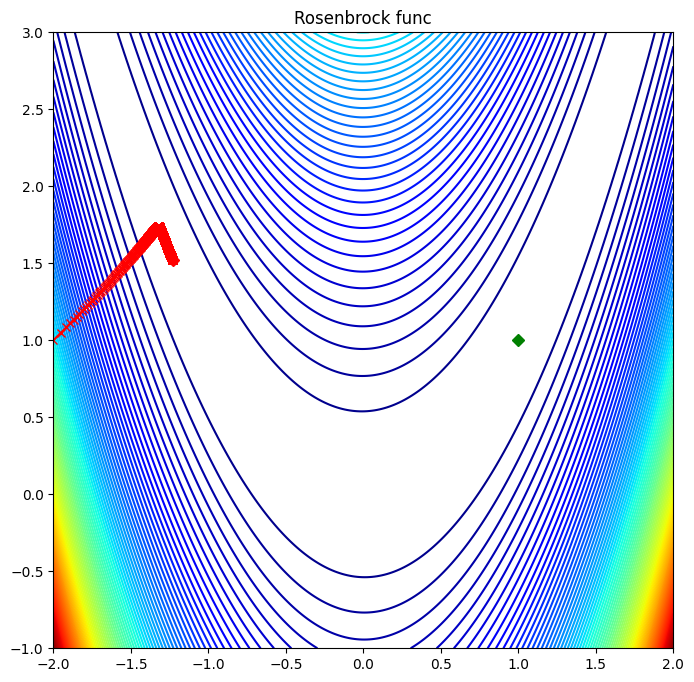

In [28]:
optimizer = Adagrad(learning_rate=0.05)
path = gradient_descent(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_matplotlib(RosenbrockTest, path)

In [29]:
optimizer = Adagrad(learning_rate=0.1)
path = gradient_descent(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(SaddleTest, path)

In [30]:
optimizer = Adagrad(learning_rate=0.01)
path = gradient_descent(
          test_cls=Bukin6Test,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(Bukin6Test, path)

In [31]:
optimizer = Adagrad(learning_rate=0.01)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(RastriginTest, path)

### **RMSProp (Root Mean Square Propagation)**

* Описание: Решает проблему снижающихся скоростей обучения Adagrad, используя скользящее среднее квадратов градиентов в знаменателе, сохраняя скорость обучения в разумном диапазоне.
* Преимущества: Преодолевает радикально снижающиеся скорости обучения Adagrad.

In [32]:
class RMSProp:
  def __init__(self, learning_rate, beta):
    self.learning_rate = learning_rate
    self.beta = beta
    self.cache_x_ema = 0
    self.cache_y_ema = 0
    self.eps = 1e-8

  def step(self, x, dx, y, dy):
    self.cache_x_ema = self.beta * self.cache_x_ema + (1 - self.beta) * dx ** 2
    self.cache_y_ema = self.beta * self.cache_y_ema + (1 - self.beta) * dy ** 2

    x = x - (self.learning_rate / (math.sqrt(self.cache_x_ema) + self.eps)) * dx
    y = y - (self.learning_rate / (math.sqrt(self.cache_y_ema) + self.eps)) * dy
    return x, y

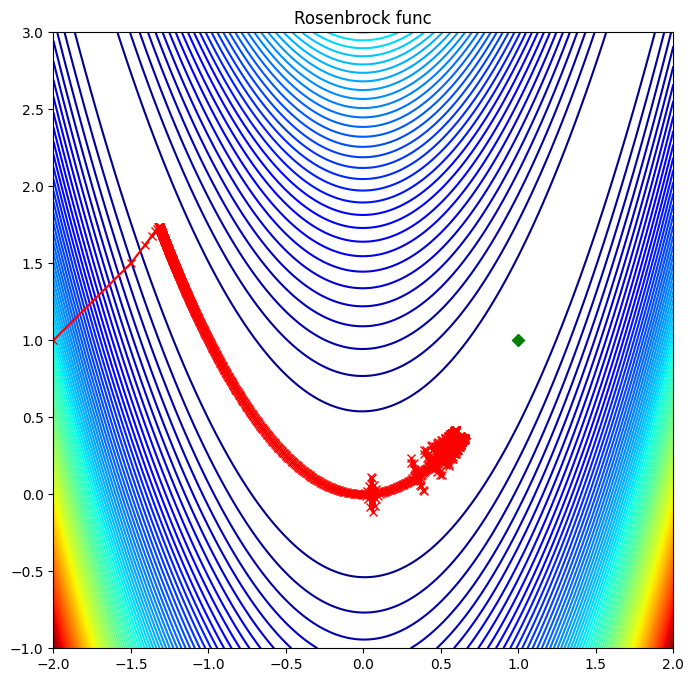

In [33]:
optimizer = RMSProp(learning_rate=0.05, beta=0.99)
path = gradient_descent(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_matplotlib(RosenbrockTest, path)

In [34]:
optimizer = RMSProp(learning_rate=0.1, beta=0.99)
path = gradient_descent(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(SaddleTest, path)

In [35]:
optimizer = RMSProp(learning_rate=0.01, beta=0.99)
path = gradient_descent(
          test_cls=Bukin6Test,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(Bukin6Test, path)

Achieve Bukin6Test bounds - stop descent on iteration 27


In [36]:
optimizer = RMSProp(learning_rate=0.01, beta=0.99)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(RastriginTest, path)

### **Adam (Adaptive Moment Estimation)**

* Описание: Объединяет идеи импульса и RMSprop, поддерживая скользящее среднее градиентов и квадратичных градиентов. Он регулирует скорость обучения для каждого параметра на основе этих моментов.
* Преимущества: Часто хорошо работает на практике и устойчив к выбору гиперпараметров.

In [37]:
class Adam:
  def __init__(self, learning_rate, momentum_rate, beta):
    self.learning_rate = learning_rate
    self.beta = beta
    self.momentum_rate = momentum_rate

    self.momentum_epa_x = 0
    self.momentum_epa_y = 0

    self.cache_x_ema = 0
    self.cache_y_ema = 0
    self.eps = 1e-8
    self.counter = 1

  def step(self, x, dx, y, dy):
    self.momentum_epa_x = (self.momentum_epa_x * self.momentum_rate +
        (1 - self.momentum_rate) * dx)
    self.momentum_epa_y = (self.momentum_epa_y * self.momentum_rate +
        (1 - self.momentum_rate) * dy)

    self.cache_x_ema = self.beta * self.cache_x_ema + (1 - self.beta) * dx ** 2
    self.cache_y_ema = self.beta * self.cache_y_ema + (1 - self.beta) * dy ** 2

    self.momentum_epa_x_correction = self.momentum_epa_x / (1 - self.momentum_rate ** self.counter)
    self.momentum_epa_y_correction = self.momentum_epa_y / (1 - self.momentum_rate ** self.counter)
    self.cache_x_ema_correction = self.cache_x_ema / (1 - self.beta ** self.counter)
    self.cache_y_ema_correction = self.cache_y_ema / (1 - self.beta ** self.counter)

    x = x - (self.learning_rate / (math.sqrt(self.cache_x_ema_correction)
      + self.eps)) * self.momentum_epa_x_correction
    y = y - (self.learning_rate / (math.sqrt(self.cache_y_ema_correction)
      + self.eps)) * self.momentum_epa_y_correction

    self.counter += 1
    return x, y

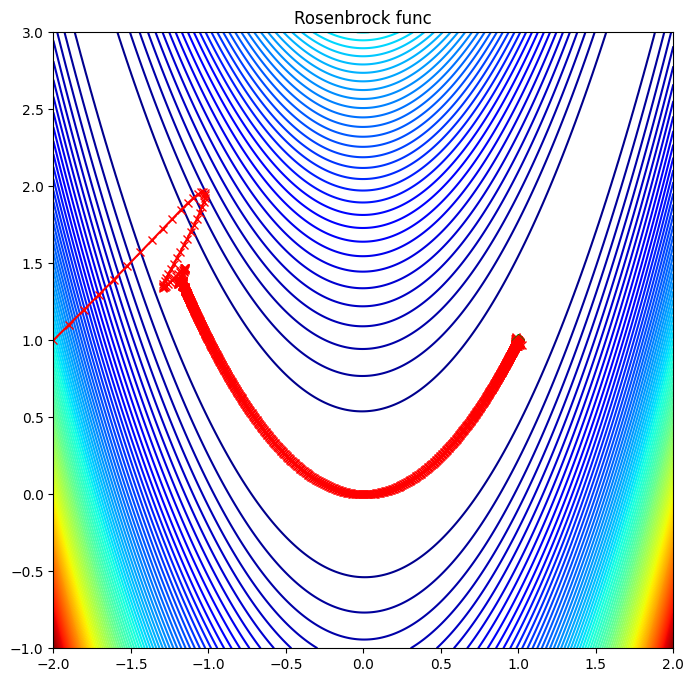

In [38]:
optimizer = Adam(learning_rate=0.1, momentum_rate=0.9, beta=0.99)
path = gradient_descent(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10000)
visualize_descent_matplotlib(RosenbrockTest, path)

In [39]:
optimizer = Adam(learning_rate=0.1, momentum_rate=0.9, beta=0.99)
path = gradient_descent(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(SaddleTest, path)

In [40]:
optimizer = Adam(learning_rate=0.01, momentum_rate=0.9, beta=0.99)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_plotly(RastriginTest, path)